# Interest Rate Prediction:

In [1]:
#importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#reading the data set
loans = pd.read_csv("loans_full_schema.csv")

In [3]:
#exploring the data set dimensions
loans.shape

(10000, 55)

# Data Cleaning:

In [4]:
#checking the % of missing value for further cleaning
nan_feature = [features for features in loans.columns if loans[features].isnull().sum()>1]

for feature in nan_feature:
  print(feature, np.round(loans[feature].isnull().mean(), 2), '% missing values')

emp_title 0.08 % missing values
emp_length 0.08 % missing values
debt_to_income 0.0 % missing values
annual_income_joint 0.85 % missing values
verification_income_joint 0.85 % missing values
debt_to_income_joint 0.85 % missing values
months_since_last_delinq 0.57 % missing values
months_since_90d_late 0.77 % missing values
months_since_last_credit_inquiry 0.13 % missing values
num_accounts_120d_past_due 0.03 % missing values


In [5]:
#dropping the columns with more than 30% missing values
nan = []
for x in loans.columns:
     if loans[x].isnull().mean() > 0.3:
            nan.append(x)
            
loans.drop(nan, axis = 1, inplace = True)            

In [6]:
#Again, inspecting the data set for missing values
nan_feature = [features for features in loans.columns if loans[features].isnull().sum()>1]

for feature in nan_feature:
  print(feature, np.round(loans[feature].isnull().mean(), 2), '% missing values')

emp_title 0.08 % missing values
emp_length 0.08 % missing values
debt_to_income 0.0 % missing values
months_since_last_credit_inquiry 0.13 % missing values
num_accounts_120d_past_due 0.03 % missing values


In [7]:
#replacing na values with respective column median
loans["emp_length"].fillna(value = loans["emp_length"].median(), inplace = True)
loans["debt_to_income"].fillna(value = loans["debt_to_income"].median(), inplace = True)
loans["months_since_last_credit_inquiry"].fillna(value = loans["months_since_last_credit_inquiry"].median(), inplace = True)
loans["num_accounts_120d_past_due"].fillna(value = loans["num_accounts_120d_past_due"].median(), inplace = True)

In [8]:
#dropping the remaining na values (if any)
loans.dropna(axis = 1, inplace = True)

In [9]:
#final inspection of the data set for any missing values
nan_feature = [features for features in loans.columns if loans[features].isnull().sum()>1]

for feature in nan_feature:
  print(feature, np.round(loans[feature].isnull().mean(), 2), '% missing values')

In [10]:
#exploring the data type of each attribute within the data set
loans.dtypes

emp_length                          float64
state                                object
homeownership                        object
annual_income                       float64
verified_income                      object
debt_to_income                      float64
delinq_2y                             int64
earliest_credit_line                  int64
inquiries_last_12m                    int64
total_credit_lines                    int64
open_credit_lines                     int64
total_credit_limit                    int64
total_credit_utilized                 int64
num_collections_last_12m              int64
num_historical_failed_to_pay          int64
current_accounts_delinq               int64
total_collection_amount_ever          int64
current_installment_accounts          int64
accounts_opened_24m                   int64
months_since_last_credit_inquiry    float64
num_satisfactory_accounts             int64
num_accounts_120d_past_due          float64
num_accounts_30d_past_due       

In [11]:
#converting the data type of time attributes to 'datetime'
loans[['earliest_credit_line', 'issue_month']] = loans[['earliest_credit_line', 'issue_month']].apply(pd.to_datetime)

In [12]:
loans_copy = loans

In [13]:
loans_copy['interest_rate'].describe()

count    10000.000000
mean        12.427524
std          5.001105
min          5.310000
25%          9.430000
50%         11.980000
75%         15.050000
max         30.940000
Name: interest_rate, dtype: float64

In [14]:
#Discretization: interest_rate (only for exploration purposes) 
loans_copy['Interest_Rate_Cat'] = pd.cut(loans_copy['interest_rate'],6,labels=['5-10%','11-15%','16-20%','21-25%','26-30%','more than 30%'])

In [15]:
#exploring the discretized variable
loans_copy['Interest_Rate_Cat'].value_counts()

11-15%           3559
5-10%            3108
16-20%           1979
21-25%            949
26-30%            297
more than 30%     108
Name: Interest_Rate_Cat, dtype: int64

# Data Exploration:

<AxesSubplot:>

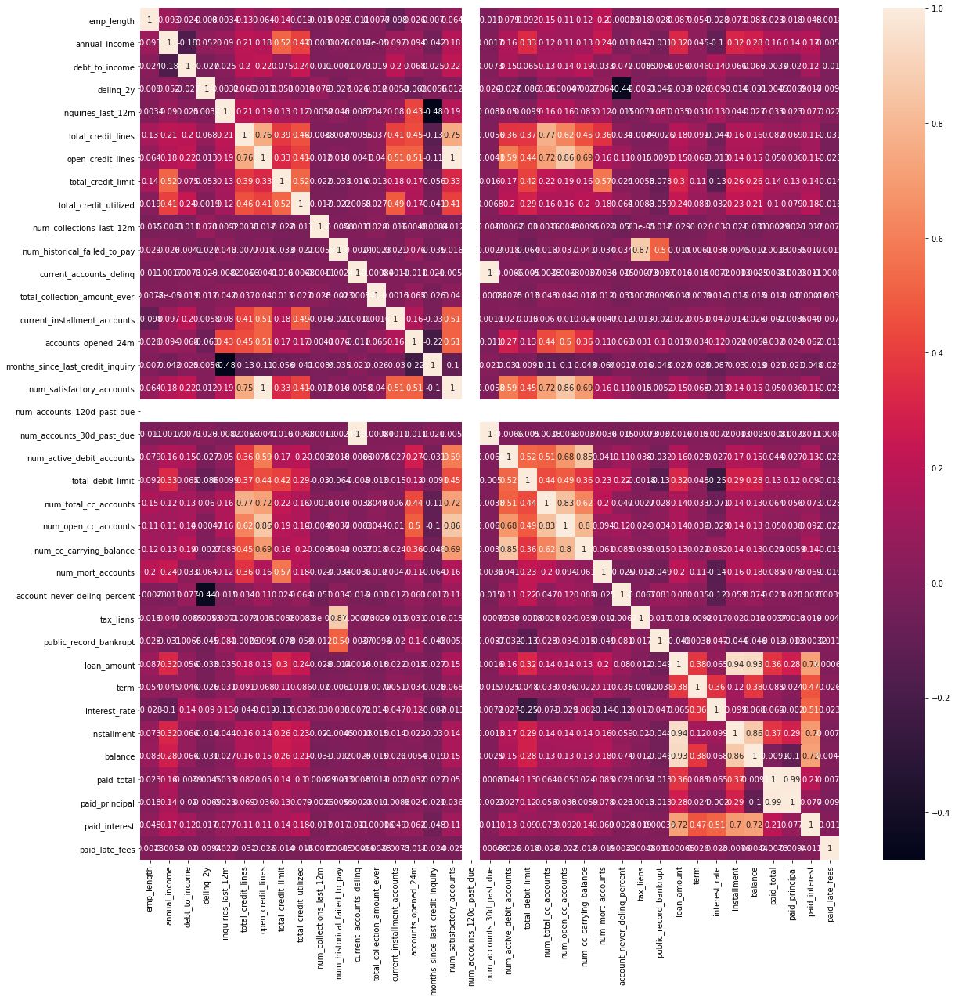

In [16]:
#heatmap of correlations of variables with each other
plt.subplots(figsize=(20, 20))
corr = loans_copy.corr()
#mask = np.triu(np.ones_like(corr, dtype=bool))
#cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, annot=True)

In [17]:
#exploring the correlation of attributes with the target variable ('interest_rate')
loans_copy.corrwith(loans_copy['interest_rate']).sort_values(ascending = False)
loans_copy.corrwith(loans_copy['interest_rate']).sort_values(ascending = False)

interest_rate                       1.000000
paid_interest                       0.514508
term                                0.358664
debt_to_income                      0.141273
inquiries_last_12m                  0.131193
accounts_opened_24m                 0.120657
installment                         0.098811
delinq_2y                           0.090456
num_cc_carrying_balance             0.081741
balance                             0.067570
paid_total                          0.065339
loan_amount                         0.064527
public_record_bankrupt              0.047477
current_installment_accounts        0.047131
num_historical_failed_to_pay        0.037563
total_credit_utilized               0.031527
num_collections_last_12m            0.029901
num_active_debit_accounts           0.026800
paid_late_fees                      0.023110
tax_liens                           0.016547
total_collection_amount_ever        0.013532
num_accounts_30d_past_due           0.007184
current_ac

From the above results, we can observe the correlation of each pf the predictors with the target variable;        
'paid_interest' is highly positively correlated variable with the target variable (interest_rate), whereas      
'total_debit_limit' is highly negatively correlated variable with the target variable.

In [18]:
#scatterplot: highest positively correlated vs highest negatively correlated attributes
import plotly.express as px
px.scatter(loans_copy, x='paid_interest', y='total_debit_limit', color = 'Interest_Rate_Cat')

From the above scatte, the correlation with the target variable is evident.
For lower interest rates, the total_debit_limit is high as compared to those for higher interest rates.
Similarly, for lower interest rates the paid interest is also low and as the rate increase the paid_interest value also increases.

Ofcourse, there are exceptions to this analysis, but that can be justified by the moderate correlation value.

In [19]:
#importing necessary libraries for interactive plots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [20]:
#interactive box-plot - 1 (highest positive correlation)
loans_copy.pivot(columns='Interest_Rate_Cat', values='paid_interest').iplot(kind='box', yTitle='Paid Interest', title='Interest Rate vs Paid Interest')

In [21]:
#interactive box-plot - 2 (highest negative correlation)
loans_copy.pivot(columns = 'Interest_Rate_Cat', values = 'total_debit_limit').iplot(kind='box', xTitle='Interest Rate', yTitle='Total Debit Limit', title='Interest Rate vs Total Debit Limit')

In [22]:
#interactive scatter plot - 1 (highly positively correlated attributes to target variable)
import plotly.figure_factory as ff
figure1 = ff.create_scatterplotmatrix(loans_copy[['term', 'debt_to_income', 'Interest_Rate_Cat']], diag='histogram', index='Interest_Rate_Cat')
figure1

In [23]:
#interactive scatter plot - 2 (highly negatively correlated attributes to target variable)
figure2 = ff.create_scatterplotmatrix(loans_copy[['num_mort_accounts', 'total_credit_limit','Interest_Rate_Cat']], diag='histogram', index='Interest_Rate_Cat')
figure2

# Final Clean Data Set:

In [24]:
#storing all the categorical attributes in a seperate data set
categorical_var = loans.select_dtypes(include='object')

#encoding the categorical attributes for further use
categorical = pd.get_dummies(data = categorical_var)

In [25]:
#storing all the numeric attributes in a seperate data set
numeric_var = loans.select_dtypes(include=('int64', 'float64'))     

#storing all the date time attributes in a seperate data set
datetime_var = loans.select_dtypes(include='datetime64[ns]')

In [26]:
#concatinating all the necessary data sets together for further model development
loans_final = pd.concat([numeric_var, categorical, datetime_var], axis = 1)

In [27]:
#exploring the final data set
loans_final.head()

,emp_length,annual_income,debt_to_income,delinq_2y,inquiries_last_12m,total_credit_lines,open_credit_lines,total_credit_limit,total_credit_utilized,num_collections_last_12m,...,loan_status_Fully Paid,loan_status_In Grace Period,loan_status_Late (16-30 days),loan_status_Late (31-120 days),initial_listing_status_fractional,initial_listing_status_whole,disbursement_method_Cash,disbursement_method_DirectPay,earliest_credit_line,issue_month
0,3.0,90000.0,18.01,0,6,28,10,70795,38767,0,...,0,0,0,0,0,1,1,0,1970-01-01 00:00:00.000002001,2018-03-01
1,10.0,40000.0,5.04,0,1,30,14,28800,4321,0,...,0,0,0,0,0,1,1,0,1970-01-01 00:00:00.000001996,2018-02-01
2,3.0,40000.0,21.15,0,4,31,10,24193,16000,0,...,0,0,0,0,1,0,1,0,1970-01-01 00:00:00.000002006,2018-02-01
3,1.0,30000.0,10.16,0,0,4,4,25400,4997,0,...,0,0,0,0,0,1,1,0,1970-01-01 00:00:00.000002007,2018-01-01
4,10.0,35000.0,57.96,0,7,22,16,69839,52722,0,...,0,0,0,0,0,1,1,0,1970-01-01 00:00:00.000002008,2018-03-01


In [28]:
loans_final.dtypes.value_counts()

uint8             119
int64              24
float64            13
datetime64[ns]      2
dtype: int64

# Data Transformation:

In [29]:
#scaling the numeric attributes of the data set, using MinMaxScaler function
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

loans_final.iloc[:, :-2] = scaler.fit_transform(loans_final.iloc[:, :-2])

# Data Split:

In [30]:
#splitting the data set into predictors (features) and outcome variable (target)
loans_features = loans_final.loc[:, loans_final.columns != 'interest_rate']
loans_target = loans_final['interest_rate'] 

In [31]:
#splitting the features and target set into train and test set
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(loans_features, loans_target, test_size = 0.2, random_state = 0)

# Decision Tree Regressor:

In [32]:
#fitting Decision Tree Regressor on the train set
from sklearn.tree import DecisionTreeRegressor
DTR = DecisionTreeRegressor()

DTR_model = DTR.fit(x_train.iloc[:, :-2], y_train)

In [33]:
#predicting the train and test set target variable
DTR_pred = DTR.predict(x_train.iloc[:, :-2])
DTR_test_pred = DTR.predict(x_test.iloc[:, :-2])

In [34]:
#checking the 'r2 score' of the model on the train and test set prediction results
from sklearn.metrics import r2_score
print('train:', r2_score(y_train, DTR_pred))
print('test:', r2_score(y_test, DTR_test_pred))

train: 1.0
test: 0.996645246423748


Clearly, the model is overfitting on the train set, hence we tune the hyperparameters and as per the results develp a new model

In [35]:
#tuning the DTR model to handle the overfitting, using GridSearchCV
from sklearn.model_selection import GridSearchCV

param_dict = {
    "splitter": ['best', 'random'],
    "max_depth": range(1,10),
    "min_samples_split": range(2,10),
    "min_samples_leaf": range(2,5)
        }

dtr = DecisionTreeRegressor()

#using the GridSearchCV function to iterate through the predefined hyperparameters of the model function
#k-fold cross-validation = 5 fold cross-validation
grid = GridSearchCV(dtr, param_grid= param_dict, cv = 5, verbose= 1, n_jobs= -1, scoring= 'neg_mean_squared_error', error_score = 'raise')

#fitting the estimator model on the train set
grid.fit(x_train.iloc[:, :-2], y_train)

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


GridSearchCV(cv=5, error_score='raise', estimator=DecisionTreeRegressor(),
             n_jobs=-1,
             param_grid={'max_depth': range(1, 10),
                         'min_samples_leaf': range(2, 5),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']},
             scoring='neg_mean_squared_error', verbose=1)

In [36]:
#finding the best paramteres values for the DTR model
grid.best_params_

{'max_depth': 9,
 'min_samples_leaf': 2,
 'min_samples_split': 4,
 'splitter': 'random'}

In [37]:
#building a new DTR model by tuning the parameters as per the above results
DTR_grid = DecisionTreeRegressor(max_depth = 9, min_samples_leaf = 2, min_samples_split = 4, splitter = 'random').fit(x_train.iloc[:, :-2], y_train)

#predicting the train set labels using the pruned DT Classifer model
DTR_pred = DTR_grid.predict(x_train.iloc[:, :-2])
DTR_test_pred = DTR_grid.predict(x_test.iloc[:, :-2])

In [38]:
#inspecting how well the new model has performed on the train and test set
print('train:', r2_score(y_train, DTR_pred))
print('test:', r2_score(y_test, DTR_test_pred))

train: 0.9984803655999555
test: 0.9997315613001188


In [39]:
#displaying the actual and predicted 'interest_rate' values
DTR_results = pd.DataFrame({'Actual (interest_rate)': y_test, 'Predicted (interest_rate)': DTR_test_pred})
print(DTR_results)

      Actual (interest_rate)  Predicted (interest_rate)
9394                0.629731                   0.632228
898                 0.218104                   0.218104
2398                0.079204                   0.079293
5906                0.535310                   0.539384
2343                0.417870                   0.417744
...                      ...                        ...
1037                0.030043                   0.029783
2899                0.161139                   0.161139
9549                0.160749                   0.160931
2740                0.055014                   0.054921
6690                0.285213                   0.285163

[2000 rows x 2 columns]


In [40]:
#visualizing the model results
import plotly.express as px
px.scatter(DTR_results, x = 'Actual (interest_rate)', y = 'Predicted (interest_rate)')

Considering the 0.99 r2_score of the parameter tuned DTR model, the above interactive scatter plot explains the linear regression between the actual test set and the predicted interest rate values.

# Random Forest Regressor:

In [41]:
#fitting Random forest Regressor on the data set
from sklearn.ensemble import RandomForestRegressor
RFR = RandomForestRegressor(n_estimators = 10, random_state = 0)

RFR_model = RFR.fit(x_train.iloc[:, :-2], y_train)

In [42]:
#predicting the train and test set target variable
RFR_pred = RFR.predict(x_train.iloc[:, :-2])
RFR_test_pred = RFR.predict(x_test.iloc[:, :-2])

In [43]:
#model performance evaluation
print('train:', r2_score(y_train, RFR_pred))
print('test:', r2_score(y_test, RFR_test_pred))

train: 0.9994967108818705
test: 0.9993436245324516


In [44]:
#exploring parameters in use before parameter tuning
print('Parameters currently in use:\n')
print(RFR.get_params())

Parameters currently in use:

{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}


In [45]:
#tuning the parameters of the RFR model, using RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

#creating the random grid using above values/variables
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [46]:
#using the RandomizedSearchCV function to iterate through the predefined hyperparameters of the model function
#k-fold cross validation = 5 fold cross-validation
RFR_cv = RandomizedSearchCV(estimator = RFR, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

RFR_cv.fit(x_train.iloc[:, :-2], y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3,
                   estimator=RandomForestRegressor(n_estimators=10,
                                                   random_state=0),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000]},
                   random_state=42, verbose=2)

In [47]:
#finding best parameter values for RFR model
RFR_cv.best_params_

{'n_estimators': 500,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'auto',
 'max_depth': 100,
 'bootstrap': True}

In [48]:
#developing a new RFR model by using parameter values from the above results
RFR_CV = RandomForestRegressor(n_estimators = 500, min_samples_split = 5, min_samples_leaf = 4, max_features = 'auto', max_depth = 100, bootstrap = True).fit(x_train.iloc[:, :-2], y_train)

#predicting the train and test set target variables
RFR_pred = RFR_CV.predict(x_train.iloc[:, :-2])
RFR_test_pred = RFR_CV.predict(x_test.iloc[:, :-2])

In [49]:
#performance evaluation of the hyperparameter tuned RFR model
print('train:', r2_score(y_train, RFR_pred))
print('test:', r2_score(y_test, RFR_test_pred))

train: 0.998633189692413
test: 0.9996570681011616


In [50]:
#displaying the actual and predicted 'interest_rate' values
RFR_results = pd.DataFrame({'Actual (interest_rate)': y_test, 'Predicted (interest_rate)': RFR_test_pred})
print(RFR_results)

      Actual (interest_rate)  Predicted (interest_rate)
9394                0.629731                   0.633129
898                 0.218104                   0.218113
2398                0.079204                   0.079226
5906                0.535310                   0.540082
2343                0.417870                   0.417847
...                      ...                        ...
1037                0.030043                   0.029676
2899                0.161139                   0.161109
9549                0.160749                   0.160851
2740                0.055014                   0.054906
6690                0.285213                   0.285190

[2000 rows x 2 columns]


In [51]:
#visualizing the model results
px.scatter(RFR_results, x = 'Actual (interest_rate)', y = 'Predicted (interest_rate)')

Considering the 0.99 r2_score of the parameter tuned RFR model, the above interactive scatter plot explains the linear regression between the actual test set and the predicted interest rate values.